In [1]:
import random
import dotenv
import pathlib
import os
import pandas as pd
import matplotlib.pyplot as plt
import torch
import numpy as np
import torch

random.seed(2024)
dotenv.load_dotenv(override=True)

HOME_DIR = os.getenv("HOME_DIR")

from ctd.task_modeling.task_env.multitask import MultiTask
from ctd.comparison.analysis.tt.tasks.tt_MultiTask import Analysis_TT_MultiTask
from ctd.comparison.analysis.tt.tt import Analysis_TT

/home/ad2002/.conda/envs/ctd/lib/python3.10/site-packages/torch/cuda/__init__.py:619: UserWarning: Can't initialize NVML
  warnings.warn("Can't initialize NVML")


## CDM Task - simplified

This task aims at modelling the experimental work
of (Mante, Sussillo et al., 2013) [29]. The network receives four inputs, two noisy input signals
uA(t) and uB(t) defined as for the DM task with independently drawn coherences and noise, and
two contextual inputs uctxA(t) and uctxB(t) defined as a one-hot encoding of the trial context. The
target output during the final task epoch is set to the sign of the coherence of the input indicated by
the active contextual cue.

#### Note that the smaller the bin size, the more memory expensive it is to create/read the DS. Increase CPU memory, needs more time to plot trials (but not if the DS already exists)

AFTER correcting the loss function (care only about response, don't mask aything before), and trying to fix the input labels (the input vector encodes both the real input in the first 4 entries, and all others are a flag to indicate what type of task is being used)

Labels are correct now, but what was failing is that the tt datasets don't specify what tasks in MultiTask each corresponds to.. so everything was saved after my first run with the complex CDM versions ... and then the trial length is given in terms of time steps, so you have to round down after dividing by the window (batch != dataloader batch) size

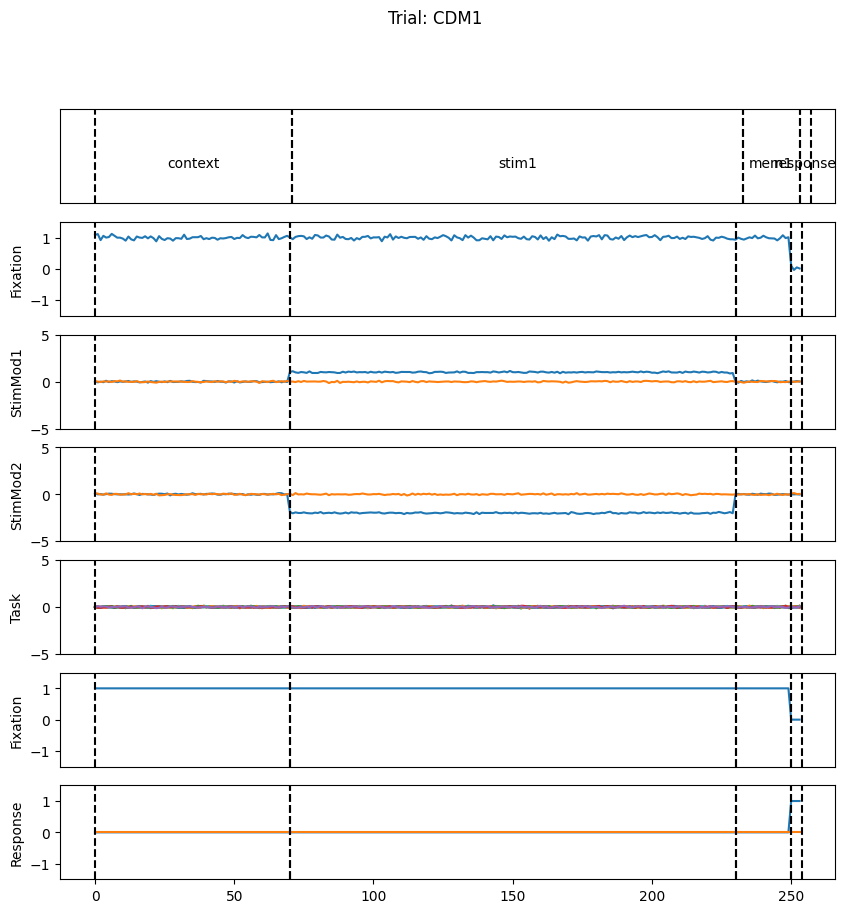

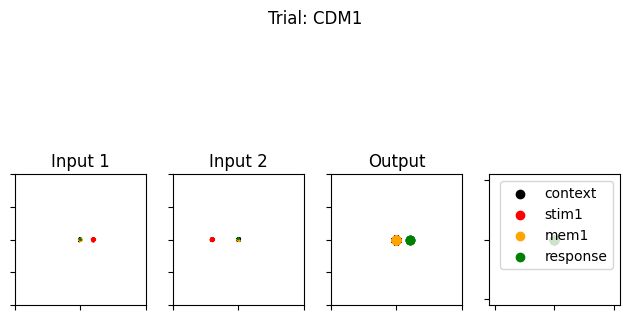

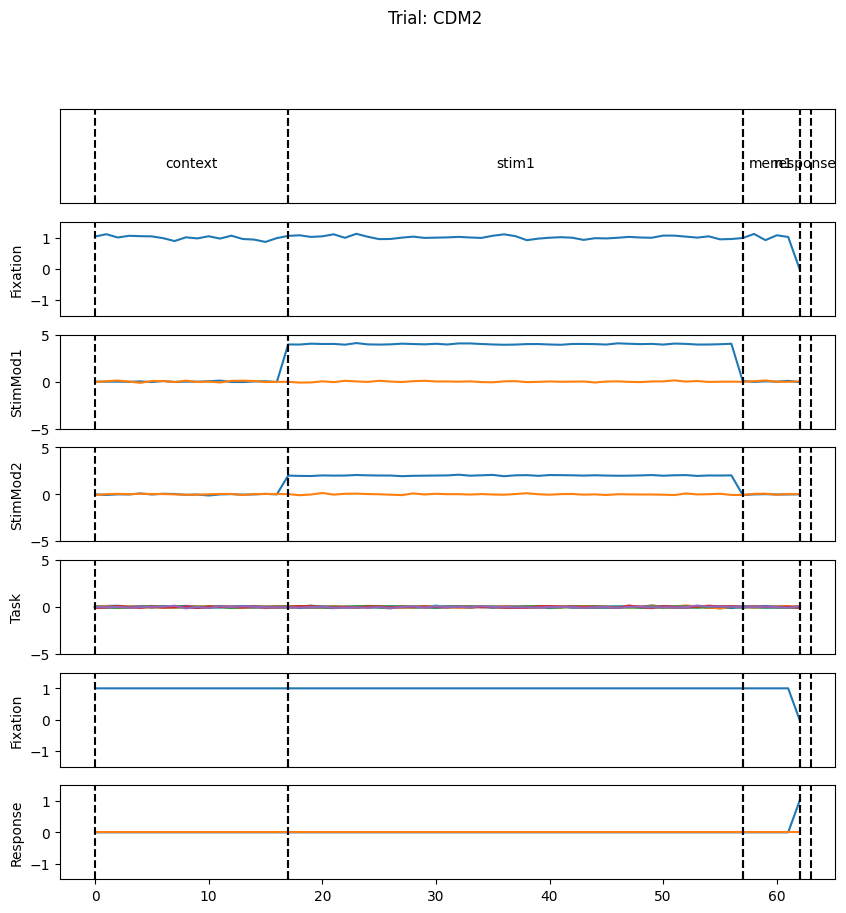

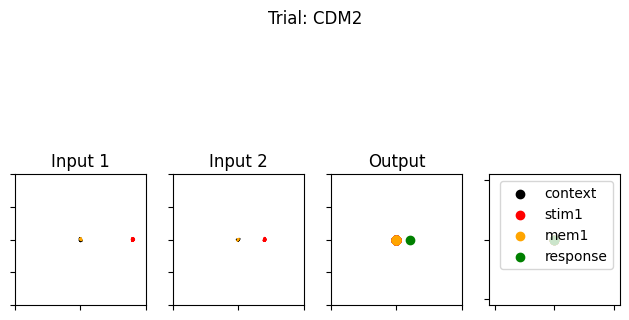

In [6]:
CDM1c = MultiTask(task_name="CDM1",
                 bin_size=5,
                 num_targets=32,
                 noise=0.05)
CDM2c = MultiTask(task_name="CDM2",
                 bin_size=20,
                 num_targets=32,
                 noise=0.05,)
CDM1 = MultiTask(task_name="DM1",
                 bin_size=20,
                 num_targets=32,
                 noise=0.05,)
CDM2 = MultiTask(task_name="DM2",
                 bin_size=20,
                 num_targets=32,
                 noise=0.05,)

CDM1c.plot_trial()
CDM2c.plot_trial()

inputs_noise, outputs, phase_dict, task_name, inputs = CDM1c.generate_trial()

## NODE

Important to compare different latent sizes - even rank 1 can technically solve it. Lowest MSE was with latent size 3, but the MSE spikes a lot with NODE, so not sure if this is relevant...

<IPython.core.display.Javascript object>


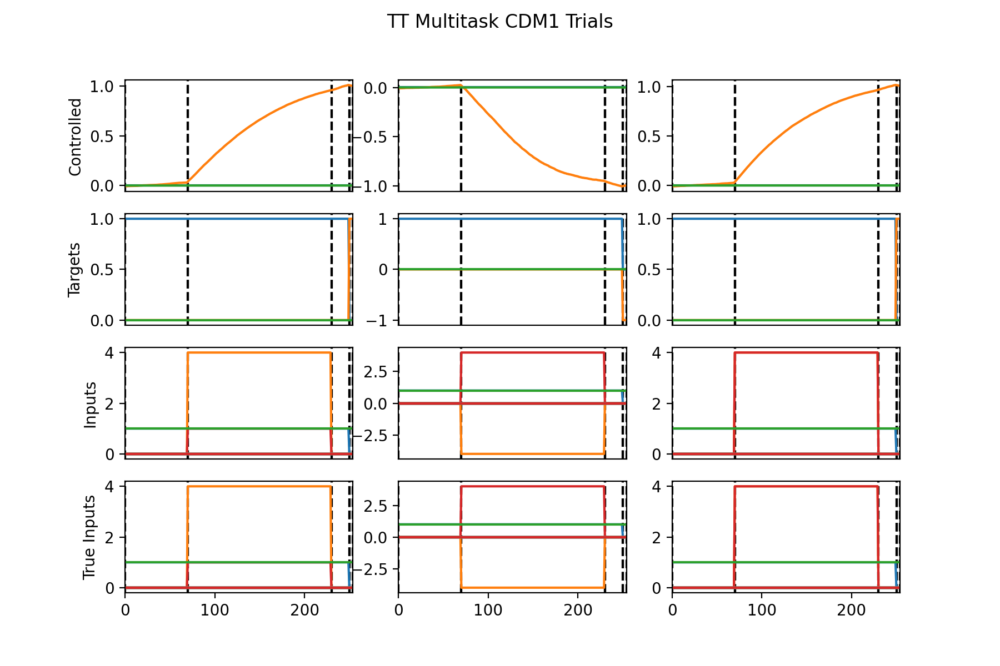

<IPython.core.display.Javascript object>


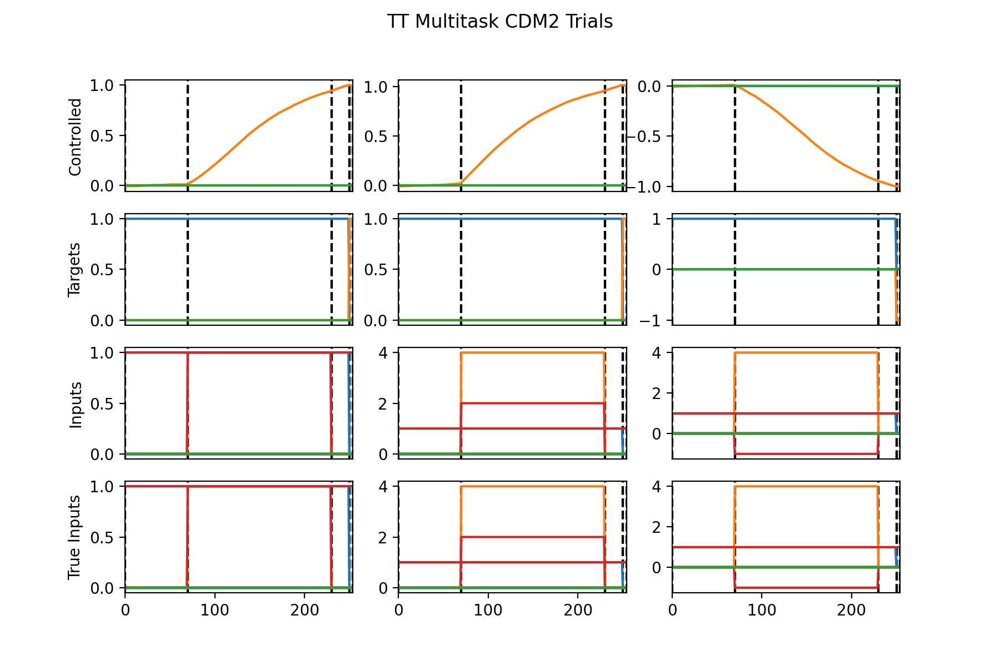

In [2]:
# Latent 1
path = "/scratch/gpfs/ad2002/content/trained_models/task-trained/20240726_NODE_MultiTask_CDM12_simple_300epoch/latent_size=1 weight_decay=1e-09 learning_rate=0.001 max_epochs=300 log_every_n_steps=8 batch_size=250 n_samples=2000 num_workers=5 task_list=['CDM1', 'CDM2'] dataset_name=CDM1CDM2 noise=0.05 loss_func=SimpleMultiTaskLoss bin_size=5 /"
node1 = Analysis_TT_MultiTask(run_name = "node_latent_1", filepath = path)

%matplotlib notebook
node1.plot_task_trial(task= "CDM1", num_trials=3)
node1.plot_task_trial(task= "CDM2", num_trials=3)

# NOTE that the x axis is in timesteps (units of bin size - total should be 1270 ms) 
# QUESTION: why are the controlled still showing 2? Does 1 latent mean one vector that can evolve, which originally
# had 2 circ variable coordinates?? Should get rid of that extra output dimension

# NOTE: the integration of the latents is clearly more smooth than vanilla RNNs - this makes sense by the
# way the architecture is designed

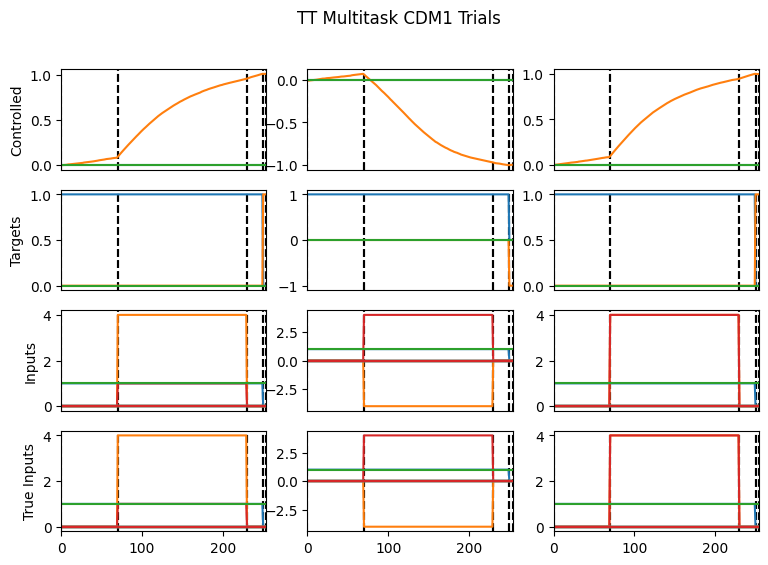

In [2]:
# Latent 2
path = "/scratch/gpfs/ad2002/content/trained_models/task-trained/20240726_NODE_MultiTask_CDM12_simple_300epoch/latent_size=2 weight_decay=1e-09 learning_rate=0.001 max_epochs=300 log_every_n_steps=8 batch_size=250 n_samples=2000 num_workers=5 task_list=['CDM1', 'CDM2'] dataset_name=CDM1CDM2 noise=0.05 loss_func=SimpleMultiTaskLoss bin_size=5 /"
node2 = Analysis_TT_MultiTask(run_name = "node_latent_2", filepath = path)

node2.plot_task_trial(task= "CDM1", num_trials=3)

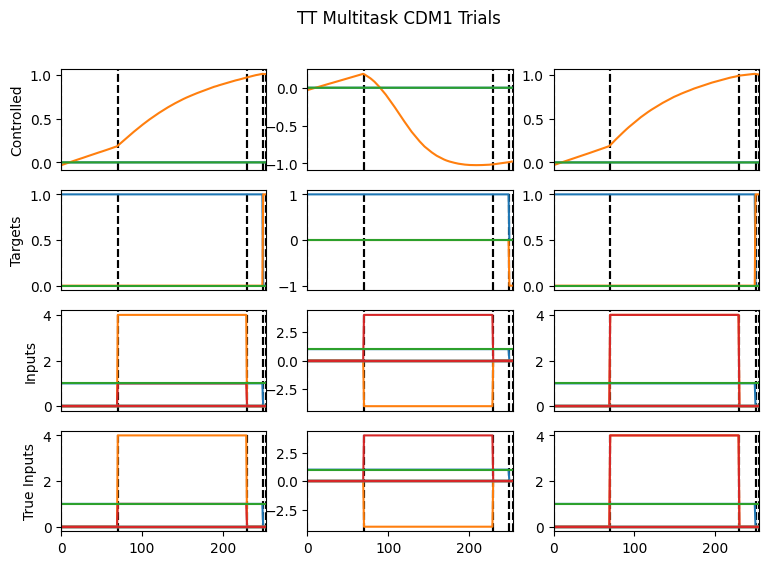

In [8]:
# Latent 3
path = "/scratch/gpfs/ad2002/content/trained_models/task-trained/20240726_NODE_MultiTask_CDM12_simple_300epoch/latent_size=3 weight_decay=1e-09 learning_rate=0.001 max_epochs=300 log_every_n_steps=8 batch_size=250 n_samples=2000 num_workers=5 task_list=['CDM1', 'CDM2'] dataset_name=CDM1CDM2 noise=0.05 loss_func=SimpleMultiTaskLoss bin_size=5 /"
node3 = Analysis_TT_MultiTask(run_name = "node_latent_3", filepath = path)

node3.plot_task_trial(task= "CDM1", num_trials=3)

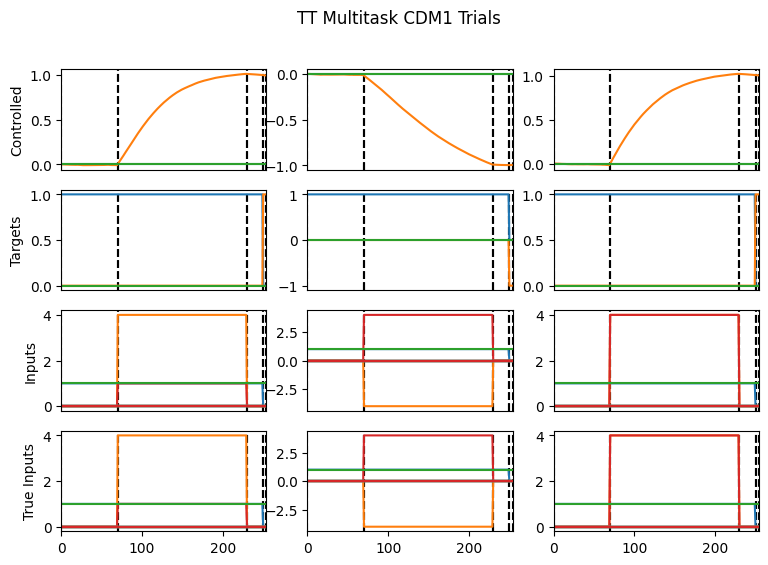

In [9]:
# Latent 4
path = "/scratch/gpfs/ad2002/content/trained_models/task-trained/20240726_NODE_MultiTask_CDM12_simple_300epoch/latent_size=4 weight_decay=1e-09 learning_rate=0.001 max_epochs=300 log_every_n_steps=8 batch_size=250 n_samples=2000 num_workers=5 task_list=['CDM1', 'CDM2'] dataset_name=CDM1CDM2 noise=0.05 loss_func=SimpleMultiTaskLoss bin_size=5 /"
node4 = Analysis_TT_MultiTask(run_name = "node_latent_4", filepath = path)

node4.plot_task_trial(task= "CDM1", num_trials=3)

<IPython.core.display.Javascript object>


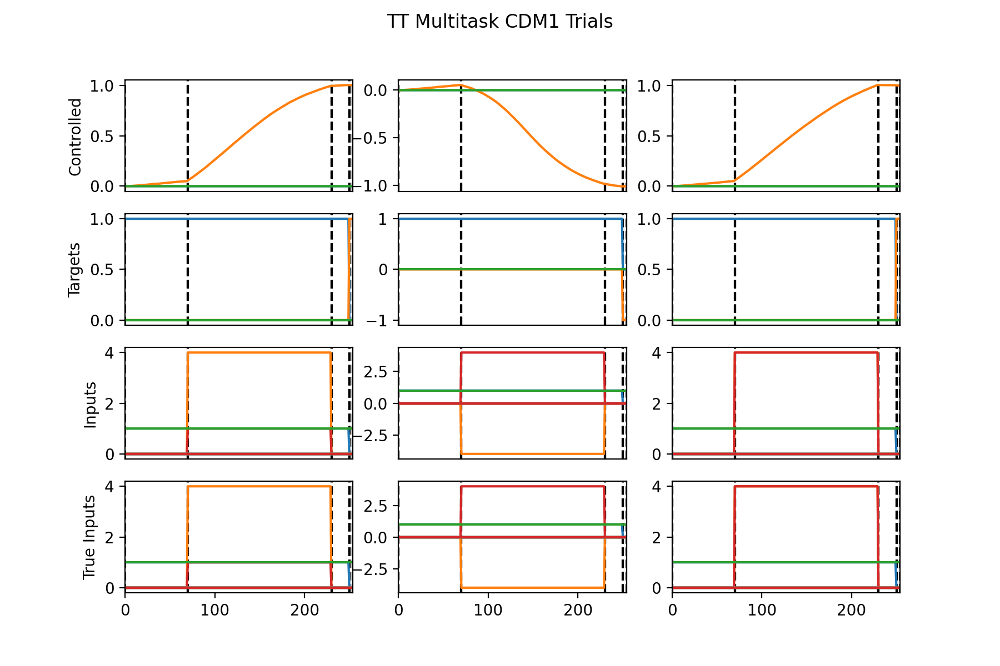

<IPython.core.display.Javascript object>


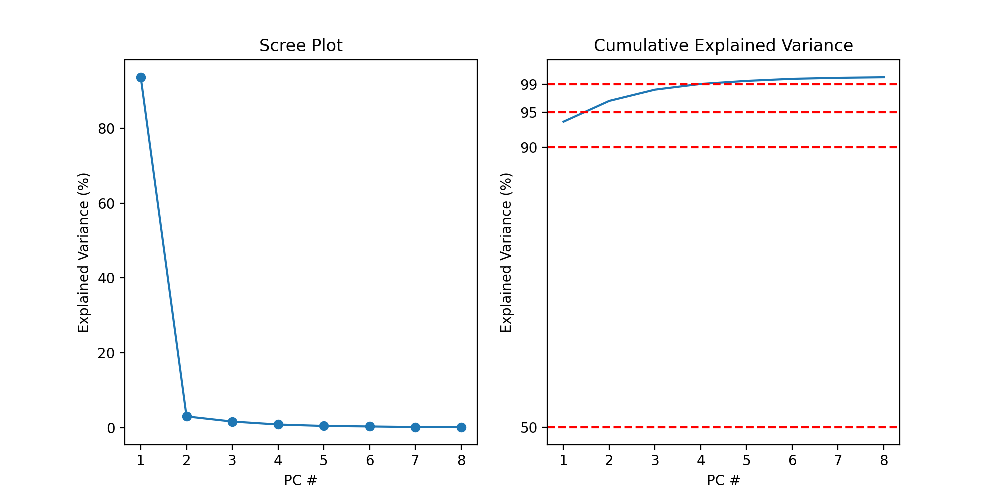

array([9.3652081e-01, 2.9722631e-02, 1.6067285e-02, 8.1646750e-03,
       4.3170289e-03, 2.9559091e-03, 1.4496697e-03, 8.0198515e-04],
      dtype=float32)

In [4]:
# Latent 8 (latent 6 with noise errored)
path = "/scratch/gpfs/ad2002/content/trained_models/task-trained/20240726_NODE_MultiTask_CDM12_simple_300epoch/latent_size=8 weight_decay=1e-09 learning_rate=0.001 max_epochs=300 log_every_n_steps=8 batch_size=250 n_samples=2000 num_workers=5 task_list=['CDM1', 'CDM2'] dataset_name=CDM1CDM2 noise=0.05 loss_func=SimpleMultiTaskLoss bin_size=5 /"
node8 = Analysis_TT_MultiTask(run_name = "node_latent_8", filepath = path)

node8.plot_task_trial(task= "CDM1", num_trials=3)
%matplotlib notebook

node8_tt = Analysis_TT(run_name = "node_latent_8", filepath = path)
node8_tt.plot_scree(max_pcs=8)


## gNODE

In [ ]:
# the loss is currently stuck

## nGRU

MSE 3e-5

<IPython.core.display.Javascript object>


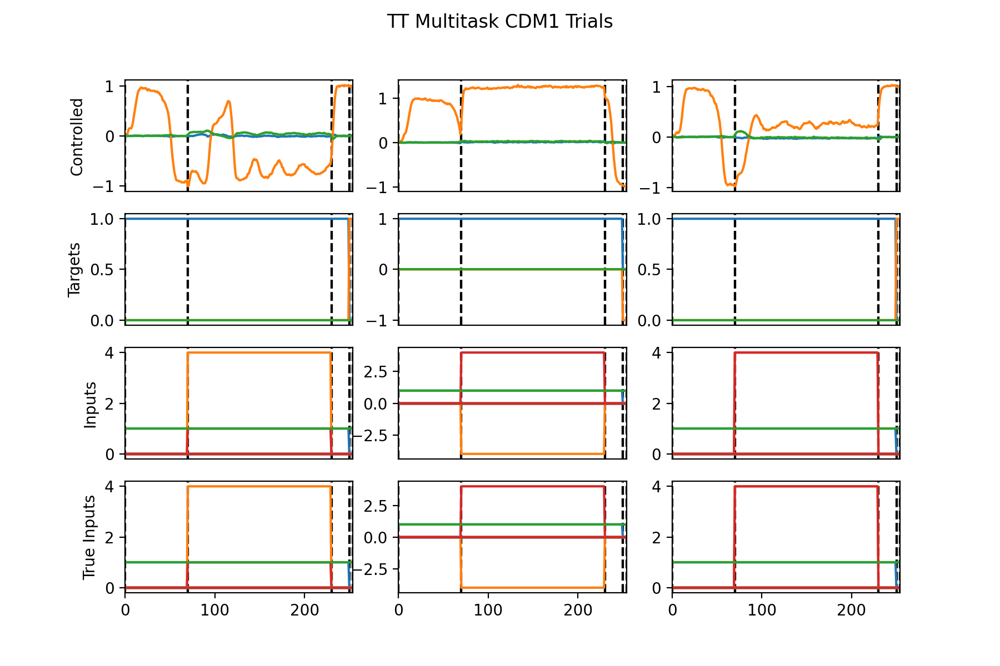

In [5]:
path = "/scratch/gpfs/ad2002/content/trained_models/task-trained/20240726_NoisyGRU_MultiTask_CDM12_simple_500epoch/latent_size=512 noise_level=0.05 weight_decay=1e-08 learning_rate=0.0001 max_epochs=500 log_every_n_steps=8 batch_size=250 n_samples=2000 num_workers=5 task_list=['CDM1', 'CDM2'] dataset_name=CDM1CDM2 noise=0 loss_func=SimpleMultiTaskLoss bin_size=5 /"
nGRU_CDM = Analysis_TT_MultiTask(run_name = "nGRU", filepath = path)

nGRU_CDM.plot_task_trial(task= "CDM1", num_trials=3)

## Full Rank RNN

With noise 0.05, MSE = 2e-4

In [19]:
path = "/scratch/gpfs/ad2002/content/trained_models/task-trained/20240726_FullRankRNN_MultiTask_CDM12_simple_500epoch/latent_size=512 weight_decay=1e-08 learning_rate=0.0001 max_epochs=500 log_every_n_steps=8 batch_size=250 n_samples=2000 num_workers=1 task_list=['CDM1', 'CDM2'] dataset_name=CDM1CDM2 noise=0.05 loss_func=SimpleMultiTaskLoss bin_size=5 /"

fr_CDM = Analysis_TT_MultiTask(run_name = "frRNN", filepath = path)

<IPython.core.display.Javascript object>


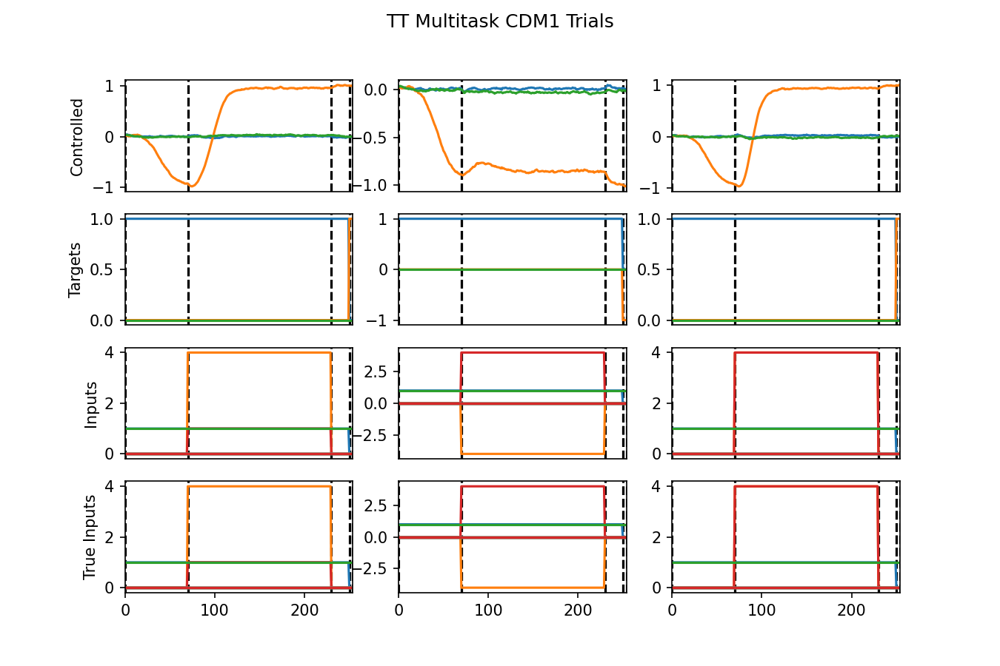

<IPython.core.display.Javascript object>


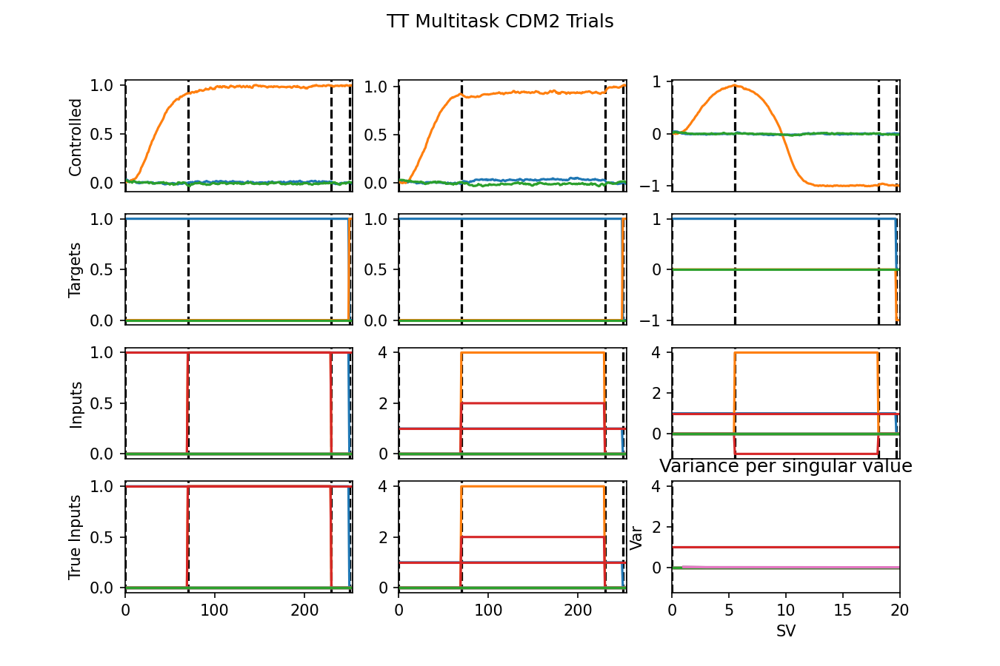

In [20]:
%matplotlib notebook
fr_CDM.plot_task_trial(task= "CDM1", num_trials=3)
fr_CDM.plot_task_trial(task= "CDM2", num_trials=3)

# NOTE: doesn't it seem that only one latent is doing the work
# NOTE: the coords shown are after PCA (this is done for latent_size > 3)
# NOTE: the output vector: [fixation output, circ coord one, circ coord two]
# I only use one cord, the other (the green below) always stays at 0, doesn't contribute to the loss change

# QUESTION: do we still want the fixation output even if we don't count the loss where it could be relevant?

In [23]:
# strength of connectivity is sparse (and logically, there's no reason why we should see some type of spatial
# pattern in an artificial network?)
%matplotlib notebook

J_fr = fr_CDM.get_weights()
# SVD on the connectivity matrix
# Note that S is linearized as a 1-D vector, but really this is the diagonal of the matrix
u, s, v = np.linalg.svd(J_fr)

total_variance = np.sum(s**2)

var = (s**2 / total_variance)

x = np.linspace(1,512,512)

plt.plot(x, var)
plt.title("Variance per singular value")
plt.xlabel("SV")
plt.ylabel("Var")
plt.xlim([0,20])
plt.show()

# fr_cdm_tt = Analysis_TT(run_name = "fr", filepath = path)
# fr_cdm_tt.plot_scree(max_pcs=10)

# My SVD decomposition and PCA analysis both suggest that the approx rank is 5

## Low Rank RNN

In [10]:
path = "/scratch/gpfs/ad2002/content/trained_models/task-trained/20240726_LowRankRNN_MultiTask_CDM12_simple_500epoch/latent_size=512 rank=1 weight_decay=0.001 learning_rate=0.001 max_epochs=500 log_every_n_steps=8 batch_size=250 n_samples=2000 num_workers=5 task_list=['CDM1', 'CDM2'] dataset_name=CDM1CDM2 noise=0 loss_func=SimpleMultiTaskLoss bin_size=5 /"

lr_CDM = Analysis_TT_MultiTask(run_name = "lrRNN", filepath = path)

<IPython.core.display.Javascript object>


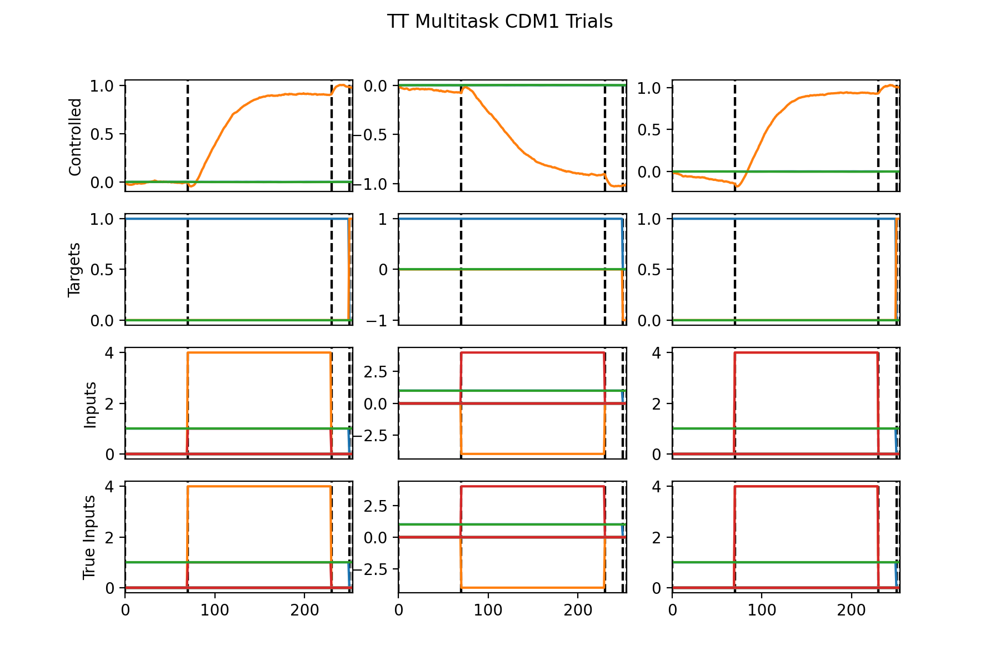

<IPython.core.display.Javascript object>


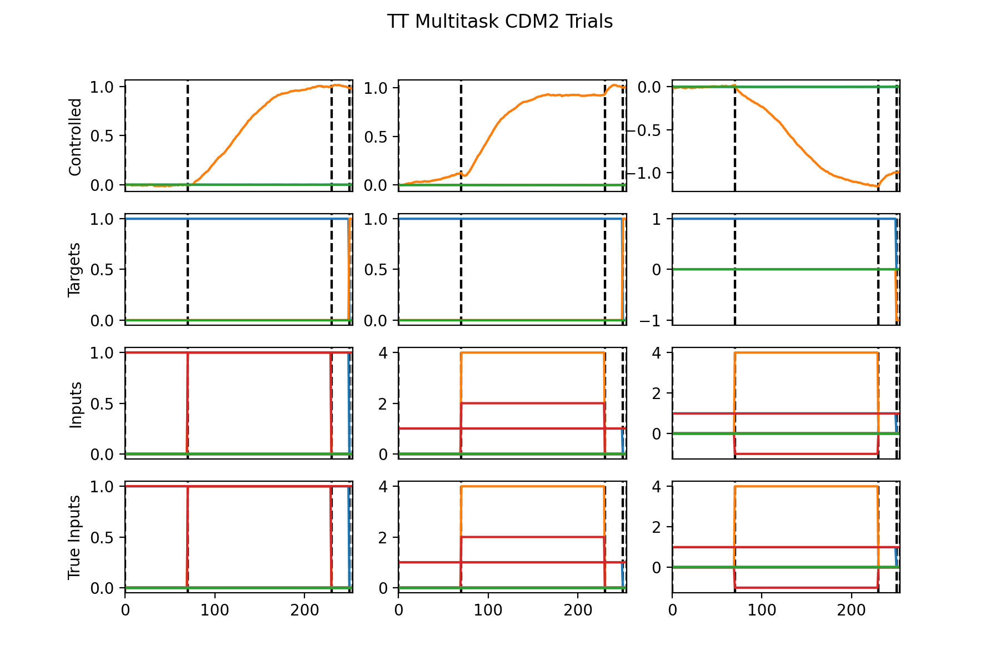

In [11]:
%matplotlib notebook
lr_CDM.plot_task_trial(task= "CDM1", num_trials=3)
lr_CDM.plot_task_trial(task= "CDM2", num_trials=3)


## Trajectories and FPs

- NODE for latent size 2
- LR for rank 2 with the $\kappa$ decomposition from the paper, using M and N.'
- some PCA for the FPs of FR and nGRU

- plotting latents + FPs in 3D plot with output - it helps make sense of the location of the fixed points (since in this case because of the readout, the combination value of the latents is not directly the output)

One could make the argument that PCA is actually more informative when only talking about trajectories: it "separates" the main two behaviors better

Computing fixed points for context

Iteration 500/1000
q = 2.63E-05 +/- 5.55E-06
dq = 2.47E-08 +/- 9.84E-09

Iteration 1000/1000
q = 1.91E-05 +/- 3.91E-06
dq = 1.09E-08 +/- 4.50E-09
Maximum iteration count reached. Terminating.
Found 2048 unique fixed points.
Computing fixed points for stim1

Iteration 500/1000
q = 1.55E-03 +/- 1.28E-03
dq = 8.40E-07 +/- 6.69E-07

Iteration 1000/1000
q = 1.19E-03 +/- 1.11E-03
dq = 6.15E-07 +/- 5.28E-07
Maximum iteration count reached. Terminating.
Found 2048 unique fixed points.
Computing fixed points for mem1

Iteration 500/1000
q = 1.60E-04 +/- 9.89E-05
dq = 2.29E-07 +/- 1.36E-07

Iteration 1000/1000
q = 8.30E-05 +/- 6.80E-05
dq = 1.01E-07 +/- 6.57E-08
Maximum iteration count reached. Terminating.
Found 2048 unique fixed points.
Computing fixed points for response

Iteration 500/1000
q = 1.70E-04 +/- 1.52E-04
dq = 8.03E-08 +/- 7.11E-08

Iteration 1000/1000
q = 1.33E-04 +/- 1.20E-04
dq = 6.77E-08 +/- 6.04E-08
Maximum iteration count reached. Terminati

<IPython.core.display.Javascript object>


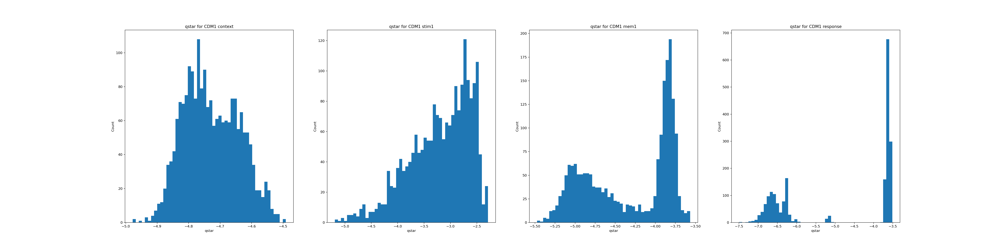

<IPython.core.display.Javascript object>


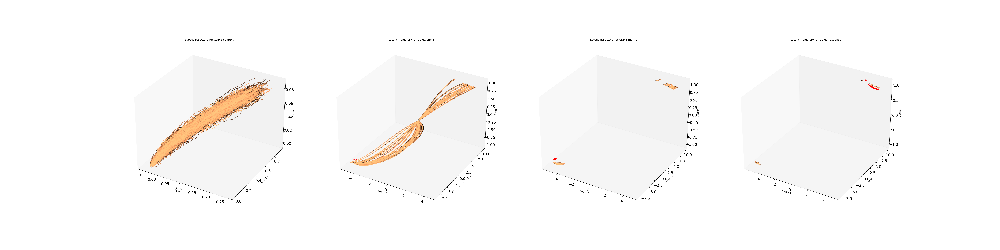

In [4]:
# for low dimensional models the "phase_for_pca" does nothing in my implementation
%matplotlib notebook
node2.plot_latent_traj("CDM1", phase_for_pca="mem1", plot_fps=True, debug_fp_traj=False, 
                       do_pca=False, fps_thresh = 1e-5, lr=1e-3, max_iters=1000, n_inits=2048,)
# shape of latents is (trials, time_steps_in_phase, latent_size)

# maybe it does make sense to plot the outputs as a 3rd dimension - that is what is shown in the trial io in the 
# plots above, and more clearly shows why the outputs end there

Computing fixed points for context

Iteration 500/1000
q = 5.15E-04 +/- 1.17E-04
dq = 6.41E-07 +/- 4.84E-07

Iteration 1000/1000
q = 3.18E-04 +/- 1.70E-04
dq = 2.24E-07 +/- 2.57E-07
Maximum iteration count reached. Terminating.
Found 2048 unique fixed points.
Computing fixed points for stim1

Iteration 500/1000
q = 1.71E-03 +/- 1.50E-03
dq = 1.27E-06 +/- 1.28E-06

Iteration 1000/1000
q = 1.20E-03 +/- 1.04E-03
dq = 8.11E-07 +/- 9.11E-07
Maximum iteration count reached. Terminating.
Found 2048 unique fixed points.
Computing fixed points for mem1

Iteration 500/1000
q = 2.14E-04 +/- 1.76E-04
dq = 2.70E-07 +/- 2.97E-07

Iteration 1000/1000
q = 1.18E-04 +/- 7.74E-05
dq = 1.32E-07 +/- 1.29E-07
Maximum iteration count reached. Terminating.
Found 2048 unique fixed points.
Computing fixed points for response

Iteration 500/1000
q = 2.57E-04 +/- 2.41E-04
dq = 1.67E-07 +/- 1.92E-07

Iteration 1000/1000
q = 1.98E-04 +/- 1.81E-04
dq = 8.19E-08 +/- 8.61E-08
Maximum iteration count reached. Terminati

<IPython.core.display.Javascript object>


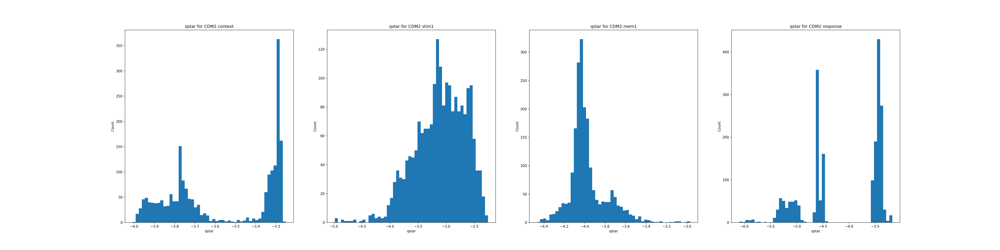

<IPython.core.display.Javascript object>


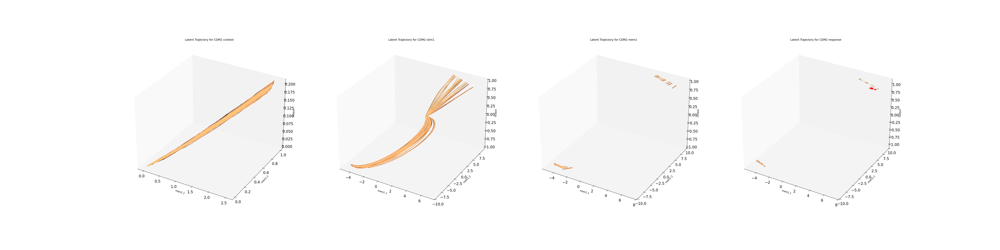

In [5]:
%matplotlib notebook
node2.plot_latent_traj("CDM2", phase_for_pca="mem1", plot_fps=True, debug_fp_traj=False, 
                       do_pca=False, fps_thresh = 1e-5, lr=1e-3, max_iters=1000, n_inits=2048,)

<IPython.core.display.Javascript object>


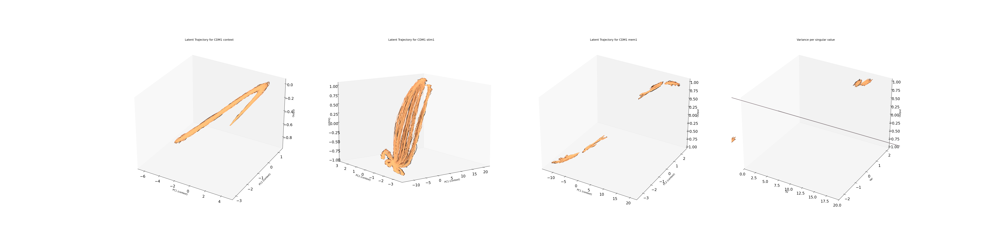

In [9]:
# how does it compare when the model has to go through PCA?
%matplotlib notebook
fr_CDM.plot_latent_traj("CDM1", phase_for_pca="context", plot_fps=False, debug_fp_traj=False, do_pca=True, fps_thresh = 1e-5, lr=1e-3, max_iters=1000, n_inits=2048,)

<IPython.core.display.Javascript object>


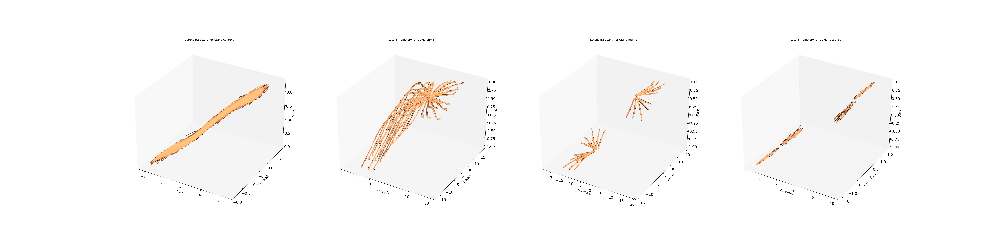

In [7]:
%matplotlib notebook
fr_CDM.plot_latent_traj("CDM2", phase_for_pca="stim1", plot_fps=False, debug_fp_traj=False, do_pca=True, fps_thresh = 1e-5, lr=1e-3, max_iters=1000, n_inits=2048,)

In [ ]:
# trying with another type of dimensionality reduction



## Flow fields in "natively" low-D models

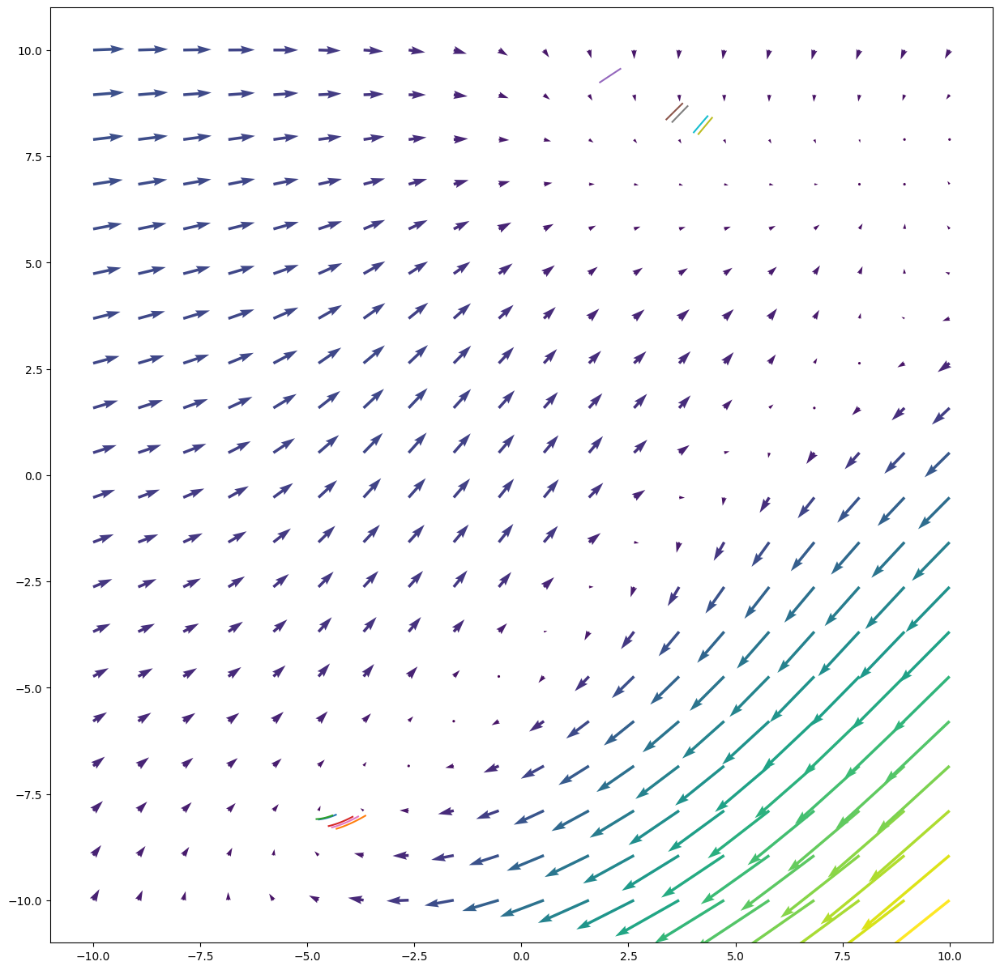

In [30]:
# now plot purely the phase space, without the output

null_inputs = torch.zeros((1,24), dtype=torch.float)

null_inputs[0][0] = 1  # -> 1 for everything before the response

# channel 1
null_inputs[0][1] = 4   # - sin(x)  -> relevant magnitude
# null_inputs[0][2] = 0   - cos(x)  -> stays zero always

# channel 2
null_inputs[0][3] = 0   #- sin(x)  -> relevant magnitude
# null_inputs[0][4] = 0   #- cos(x)  -> stays zero always

node2.plot_flow_field("CDM1", [[-10,10], [-10, 10]], phases=["mem1"],
                        num_points=20, num_trials=10, use_null_inputs=null_inputs)

# plot with different inputs - plot by evidence strength
# and other inputs that were used to train
# construct the input vectors to keep the flag - but still don't let all the real inputs to be zero 
# the endpoints (memory) points are the most interesting - which stimuli favor each side more strongly

# plot the trajs on top

# notice where the arrows go from the origin for each input - bias towards positive attractor

# check why the latents don't start exactly at the origin
# run trajs for each phase for longer - check carefully what the change in input signals change in phase 

# simple check for fixed point finder: just run the latents forward - mark the timepoint 160, and then for
# timepoints later on

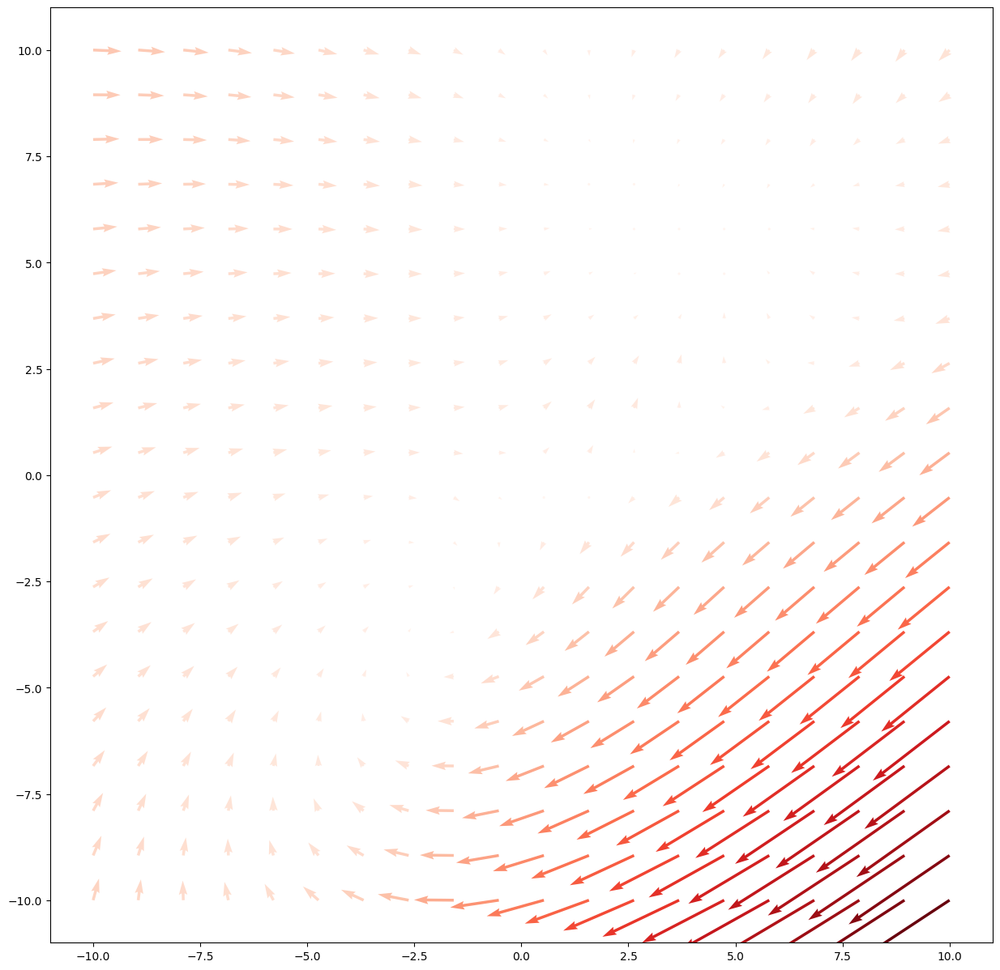

In [7]:
node2.plot_flow_field("CDM2", [[-10,10], [-10, 10]], phases=["response"],
                        num_points=20, num_trials=10)

In [ ]:
# simualte neural data - ok to fit to all the phases

# to fit to the lint Model - fit by phases: do you recover the fields expected for each period? eventually train 

# then use nodes, gnodes, transformers on the synthetic, then reocver m?

## Preliminary work on Driscoll's circular variable CDM task

There are four modes implemented in CtD under the MultiTask class. From Driscoll et al.: Move in direction of stimulus with largest amplitude. IntegrationModality1: Only modality 1 is presented. IntegrationModality2: Only modality 2 is presented. ContextInt Modality1: Both modalities presented, only attend modality 1. ContextIntModality2: Both modalities presented, only attend modality 2. IntegrationMultimodal: Both modalities presented, attend both mo
dalities equally.

#### Note that all trial lengths and phase lengths are NOT the same

* NODE model optimized for this

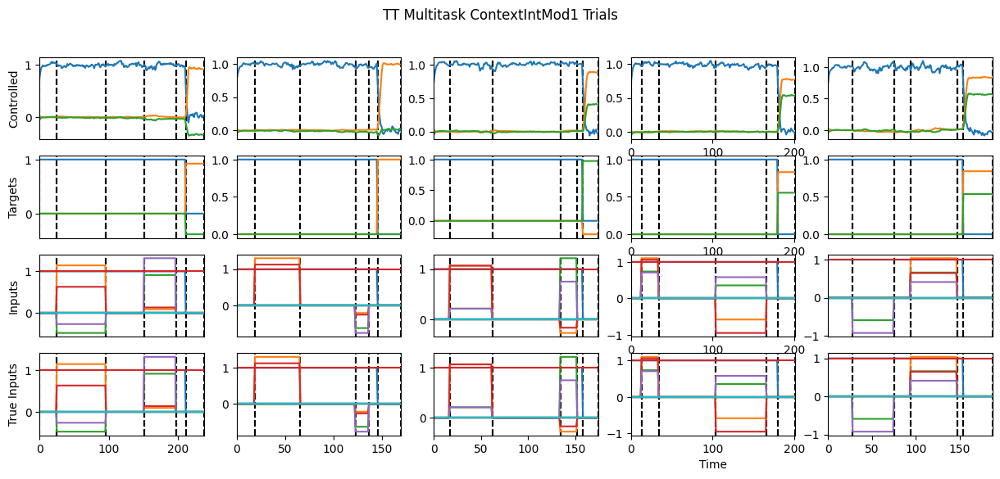

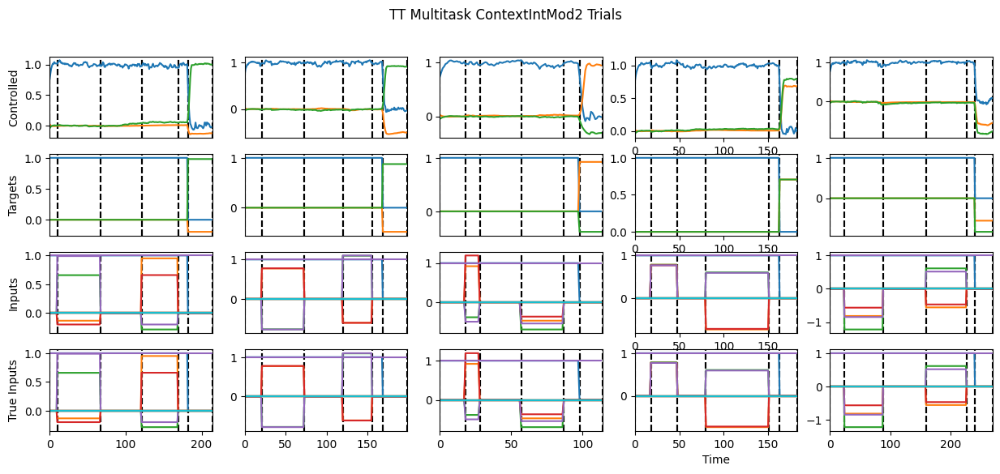

In [2]:
# NODE without noise. Latent size 10. MSE ~0.2
path = "/scratch/gpfs/ad2002/content/trained_models/task-trained/20240718_NODE_MultiTask_CDM12_LAT10_600epoch/task_list=['ContextIntMod1', 'ContextIntMod2'] noise=0.0 dynamic_noise=0.1 /"
node_CDM10 = Analysis_TT_MultiTask(run_name = "node_CDM10", filepath = path, use_train_dm=False)

node_CDM10.plot_task_trial(task= "ContextIntMod1", num_trials=5)

node_CDM10.plot_task_trial(task= "ContextIntMod2", num_trials=5)

Computing fixed points for interp. 0 of 10

Iteration 500/5000
q = 2.35E-06 +/- 5.68E-06
dq = 5.21E-09 +/- 1.53E-08

Iteration 1000/5000
q = 1.12E-06 +/- 2.87E-06
dq = 1.27E-09 +/- 4.51E-09

Iteration 1500/5000
q = 7.48E-07 +/- 1.90E-06
dq = 4.37E-10 +/- 1.25E-09

Iteration 2000/5000
q = 5.62E-07 +/- 1.35E-06
dq = 3.05E-10 +/- 1.50E-09

Iteration 2500/5000
q = 4.34E-07 +/- 7.77E-07
dq = 2.01E-10 +/- 1.05E-09

Iteration 3000/5000
q = 3.56E-07 +/- 5.26E-07
dq = 1.28E-10 +/- 3.50E-10

Iteration 3500/5000
q = 3.03E-07 +/- 4.23E-07
dq = 9.15E-11 +/- 2.03E-10

Iteration 4000/5000
q = 2.63E-07 +/- 3.48E-07
dq = 7.91E-11 +/- 2.86E-10

Iteration 4500/5000
q = 2.29E-07 +/- 2.82E-07
dq = 6.09E-11 +/- 1.43E-10

Iteration 5000/5000
q = 2.02E-07 +/- 2.39E-07
dq = 4.98E-11 +/- 1.18E-10
Maximum iteration count reached. Terminating.
Found 1024 unique fixed points.
Computing fixed points for interp. 1 of 10

Iteration 500/5000
q = 1.49E-07 +/- 1.57E-07
dq = 8.49E-11 +/- 5.75E-10

Iteration 1000/5000
q =


Iteration 3500/5000
q = 2.38E-08 +/- 4.55E-08
dq = 2.71E-12 +/- 5.32E-12

Iteration 4000/5000
q = 2.37E-08 +/- 4.55E-08
dq = 2.71E-12 +/- 3.40E-12

Iteration 4500/5000
q = 2.37E-08 +/- 4.54E-08
dq = 2.59E-12 +/- 4.03E-12

Iteration 5000/5000
q = 2.36E-08 +/- 4.54E-08
dq = 2.57E-12 +/- 3.37E-12
Maximum iteration count reached. Terminating.
Found 1024 unique fixed points.


/home/ad2002/ComputationThruDynamicsBenchmark/ctd/comparison/analysis/tt/tasks/tt_MultiTask.py:224: UserWarning: *c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
  ax.scatter(


10


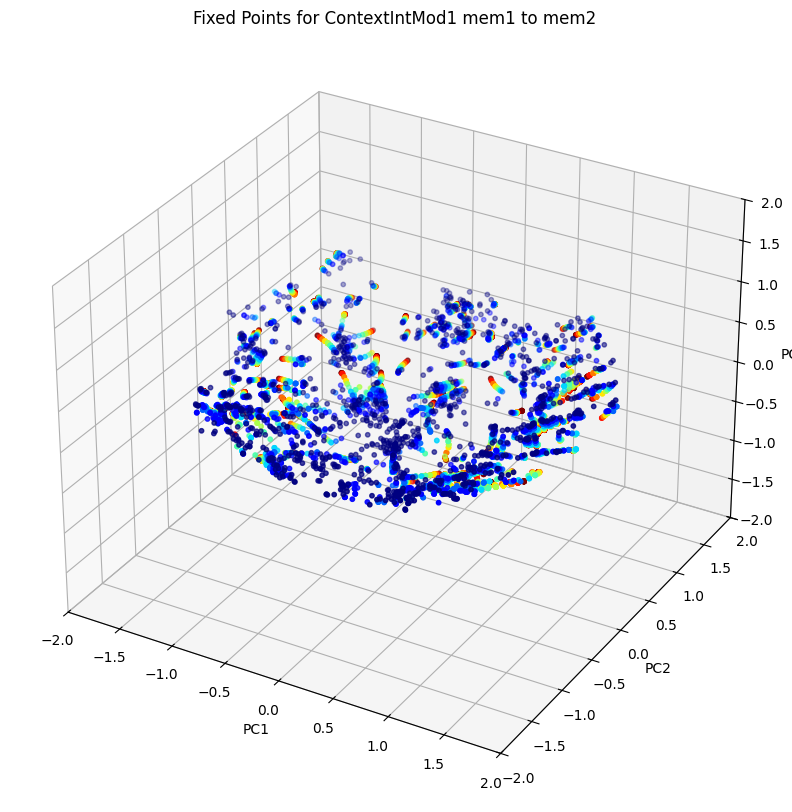

In [3]:
# Phases of CDM: context, stim1, mem1, stim2, mem2, response
node_CDM10.plot_fps_phase_interpolation(
        "ContextIntMod1",
        "mem1",
        "mem2",
        n_interp_steps=10,
        lr=1e-3,
        noise_scale=0.0,
        max_iters_init=5000,
        max_iters=5000,
        n_inits=1024,
        use_noisy=False,
    )